In [1]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("housing_train.csv")

In [3]:
data.head(5)

,id,url,region,region_url,price,type,sqfeet,beds,baths,cats_allowed,...,wheelchair_access,electric_vehicle_charge,comes_furnished,laundry_options,parking_options,image_url,description,lat,long,state
0,7039061606,https://bham.craigslist.org/apa/d/birmingham-h...,birmingham,https://bham.craigslist.org,1195,apartment,1908,3,2.0,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00L0L_80pNkyDeG0...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al
1,7041970863,https://bham.craigslist.org/apa/d/birmingham-w...,birmingham,https://bham.craigslist.org,1120,apartment,1319,3,2.0,1,...,0,0,0,laundry on site,off-street parking,https://images.craigslist.org/00707_uRrY9CsNMC...,Find Your Way to Haven Apartment Homes Come ho...,33.3755,-86.8045,al
2,7041966914,https://bham.craigslist.org/apa/d/birmingham-g...,birmingham,https://bham.craigslist.org,825,apartment,1133,1,1.5,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00h0h_b7Bdj1NLBi...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al
3,7041966936,https://bham.craigslist.org/apa/d/birmingham-f...,birmingham,https://bham.craigslist.org,800,apartment,927,1,1.0,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00808_6ghZ8tSRQs...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al
4,7041966888,https://bham.craigslist.org/apa/d/birmingham-2...,birmingham,https://bham.craigslist.org,785,apartment,1047,2,1.0,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00y0y_21c0FOvUXm...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al


***Describing the data***

In [4]:
data.shape

(265190, 22)

In [5]:
data.info

<bound method DataFrame.info of                 id                                                url  \
0       7039061606  https://bham.craigslist.org/apa/d/birmingham-h...   
1       7041970863  https://bham.craigslist.org/apa/d/birmingham-w...   
2       7041966914  https://bham.craigslist.org/apa/d/birmingham-g...   
3       7041966936  https://bham.craigslist.org/apa/d/birmingham-f...   
4       7041966888  https://bham.craigslist.org/apa/d/birmingham-2...   
...            ...                                                ...   
265185  7050851033  https://columbus.craigslist.org/apa/d/columbus...   
265186  7050887997  https://columbus.craigslist.org/apa/d/grove-ci...   
265187  7044801015  https://columbus.craigslist.org/apa/d/columbus...   
265188  7050885800  https://columbus.craigslist.org/apa/d/newark-l...   
265189  7050884586  https://columbus.craigslist.org/apa/d/columbus...   

            region                       region_url  price       type  sqfeet  \
0       bi

***Checking for null values***

In [6]:
data.isnull().values.any()

True

In [7]:
data.dtypes

id                           int64
url                         object
region                      object
region_url                  object
price                        int64
type                        object
sqfeet                       int64
beds                         int64
baths                      float64
cats_allowed                 int64
dogs_allowed                 int64
smoking_allowed              int64
wheelchair_access            int64
electric_vehicle_charge      int64
comes_furnished              int64
laundry_options             object
parking_options             object
image_url                   object
description                 object
lat                        float64
long                       float64
state                       object
dtype: object

In [8]:
data.isnull().sum()

id                             0
url                            0
region                         0
region_url                     0
price                          0
type                           0
sqfeet                         0
beds                           0
baths                          0
cats_allowed                   0
dogs_allowed                   0
smoking_allowed                0
wheelchair_access              0
electric_vehicle_charge        0
comes_furnished                0
laundry_options            54311
parking_options            95135
image_url                      0
description                    2
lat                         1419
long                        1419
state                          1
dtype: int64

**removing those rows which have null values in lat & long columns**

In [9]:
data.dropna(axis = 'index',how = 'all', subset = ['lat','long'],inplace = True)

In [10]:
data.shape

(263771, 22)

In [11]:

df = data.copy()

In [12]:
df.head()

,id,url,region,region_url,price,type,sqfeet,beds,baths,cats_allowed,...,wheelchair_access,electric_vehicle_charge,comes_furnished,laundry_options,parking_options,image_url,description,lat,long,state
0,7039061606,https://bham.craigslist.org/apa/d/birmingham-h...,birmingham,https://bham.craigslist.org,1195,apartment,1908,3,2.0,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00L0L_80pNkyDeG0...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al
1,7041970863,https://bham.craigslist.org/apa/d/birmingham-w...,birmingham,https://bham.craigslist.org,1120,apartment,1319,3,2.0,1,...,0,0,0,laundry on site,off-street parking,https://images.craigslist.org/00707_uRrY9CsNMC...,Find Your Way to Haven Apartment Homes Come ho...,33.3755,-86.8045,al
2,7041966914,https://bham.craigslist.org/apa/d/birmingham-g...,birmingham,https://bham.craigslist.org,825,apartment,1133,1,1.5,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00h0h_b7Bdj1NLBi...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al
3,7041966936,https://bham.craigslist.org/apa/d/birmingham-f...,birmingham,https://bham.craigslist.org,800,apartment,927,1,1.0,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00808_6ghZ8tSRQs...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al
4,7041966888,https://bham.craigslist.org/apa/d/birmingham-2...,birmingham,https://bham.craigslist.org,785,apartment,1047,2,1.0,1,...,0,0,0,laundry on site,street parking,https://images.craigslist.org/00y0y_21c0FOvUXm...,Apartments In Birmingham AL Welcome to 100 Inv...,33.4226,-86.7065,al


In [13]:
df = df.drop(['url','region_url','image_url'],axis=1)

In [14]:
df.isnull().sum()

id                             0
region                         0
price                          0
type                           0
sqfeet                         0
beds                           0
baths                          0
cats_allowed                   0
dogs_allowed                   0
smoking_allowed                0
wheelchair_access              0
electric_vehicle_charge        0
comes_furnished                0
laundry_options            54127
parking_options            94444
description                    2
lat                            0
long                           0
state                          0
dtype: int64

w/d in unit           90393
w/d hookups           49880
laundry on site       39109
laundry in bldg       27722
no laundry on site     2540
Name: laundry_options, dtype: int64


<AxesSubplot:>

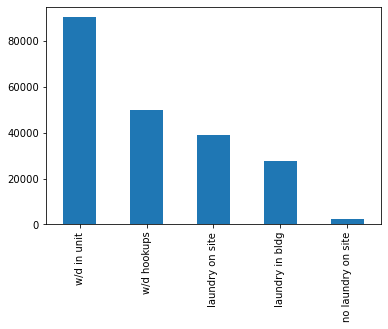

In [15]:
print(df['laundry_options'].value_counts())
df['laundry_options'].value_counts().plot(kind = 'bar')

#### Filling NA value using Random Imputation

In [16]:
# there are 54127 null values in laundry options
# obtaining a sample size of 54127
random_sample = df['laundry_options'].dropna().sample(54127)
random_sample

50641         w/d in unit
229819    laundry in bldg
665           w/d hookups
259033        w/d hookups
44995     laundry on site
               ...       
115283        w/d hookups
60706         w/d in unit
191871        w/d hookups
263509        w/d hookups
40949         w/d in unit
Name: laundry_options, Length: 54127, dtype: object

In [17]:
# the index are different from random_sample and NA values in the dataset 
random_sample.index = df[df['laundry_options'].isnull()].index
random_sample

10            w/d in unit
49        laundry in bldg
62            w/d hookups
64            w/d hookups
65        laundry on site
               ...       
265157        w/d hookups
265161        w/d in unit
265163        w/d hookups
265174        w/d hookups
265187        w/d in unit
Name: laundry_options, Length: 54127, dtype: object

<AxesSubplot:>

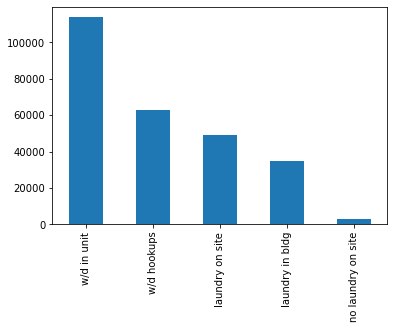

In [18]:
df.loc[df['laundry_options'].isnull(),'laundry_options']=random_sample
df['laundry_options'].value_counts().plot(kind = 'bar')

#### Imputing NA values of parking_options

In [19]:
df['parking_options'].isnull().sum()

94444

In [20]:
df['parking_options'].value_counts()/len(df)*100

off-street parking    33.399805
carport               10.848046
attached garage       10.316145
detached garage        4.838667
street parking         4.000061
no parking             0.745723
valet parking          0.046252
Name: parking_options, dtype: float64

<AxesSubplot:>

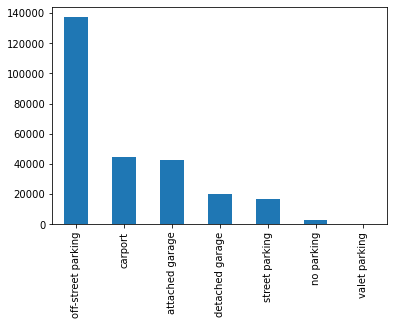

In [21]:

random_sample = df['parking_options'].dropna().sample(94444)
random_sample.index = df[df['parking_options'].isnull()].index
df.loc[df['parking_options'].isnull(),'parking_options']=random_sample
df['parking_options'].value_counts().plot(kind = 'bar')

In [22]:
df['parking_options'].value_counts()/len(df)*100

off-street parking    52.019365
carport               16.887376
attached garage       16.074550
detached garage        7.531533
street parking         6.258459
no parking             1.160097
valet parking          0.068620
Name: parking_options, dtype: float64

In [23]:
# except for description no other feature has null values
df.isnull().sum()

id                         0
region                     0
price                      0
type                       0
sqfeet                     0
beds                       0
baths                      0
cats_allowed               0
dogs_allowed               0
smoking_allowed            0
wheelchair_access          0
electric_vehicle_charge    0
comes_furnished            0
laundry_options            0
parking_options            0
description                2
lat                        0
long                       0
state                      0
dtype: int64

### Performing Text Analysis on Description feature

In [24]:
# importing modules
#!pip install wordcloud
from wordcloud import WordCloud , STOPWORDS

In [25]:
stopwords = set(STOPWORDS)
all_description =''


# we are considering only a sample of data for word cloud
for text in df['description'][0:10000]:
    text = str(text)
    
    #generating tokens by spliting the values
    tokens = text.split()
    
    #converting them into case insensitive
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    
    all_description = all_description + " ".join(tokens)

### Generating wordcloud

In [26]:
wordcloud = WordCloud(width = 1000, height = 800, stopwords = stopwords,background_color = 'white').generate(all_description)

In [ ]:
#plotting wordcloud
plt.figure(figsize = (10,8))
plt.imshow(wordcloud)
plt.axis("off")

### Most users basically need a pet friendly home , apartment, fitness center, swimming pool,washer dryer and so...
#### But exact estimates are unavailable

In [28]:
#!pip install nltk
from nltk.corpus import RegexpTokenizer as regextoken


In [29]:
df['description'].fillna('no description',inplace = True)


In [30]:
#creating a regular expression tokenizer that have only alphabets,i.e remove all the specical character and numeric characters
tokenizer = regextoken("[a-zA-Z]+")
tokenizer

RegexpTokenizer(pattern='[a-zA-Z]+', gaps=False, discard_empty=True, flags=re.UNICODE|re.MULTILINE|re.DOTALL)

In [31]:
#creating a sample 
sample = df.sample(10000)
sample.head(3)

,id,region,price,type,sqfeet,beds,baths,cats_allowed,dogs_allowed,smoking_allowed,wheelchair_access,electric_vehicle_charge,comes_furnished,laundry_options,parking_options,description,lat,long,state
137607,7043627783,indianapolis,580,apartment,646,1,1.0,1,1,1,0,0,0,laundry on site,street parking,Pangea Meadows - Call Now: show contact info ...,39.7940,-86.2707,in
45551,7049842812,SF bay area,2395,apartment,815,2,1.0,0,0,0,0,0,0,laundry on site,carport,Contact info: | Los Gatos Gardens | text/call ...,37.2532,-121.9600,ca
66225,7028231148,new haven,2250,house,1250,5,2.0,1,1,0,0,0,0,w/d in unit,off-street parking,"Completely remodeled and renovated, beautiful ...",41.2790,-72.9535,ct


In [32]:
#converting them to lower case
sample['description'] = sample['description'].apply(lambda x: x.lower())


#applying the tokenizer to each row of the sample description
sample_tokens = sample['description'].apply(tokenizer.tokenize)
print(sample_tokens)

137607    [pangea, meadows, call, now, show, contact, in...
45551     [contact, info, los, gatos, gardens, text, cal...
66225     [completely, remodeled, and, renovated, beauti...
62614     [bedroom, bathroom, sqft, home, and, car, gara...
121835    [take, a, tour, today, now, leasing, winter, h...
                                ...                        
5467      [application, administration, fee, happy, than...
11594     [call, text, patrick, today, for, details, and...
38184     [located, in, the, heart, of, north, natomas, ...
44043     [call, us, today, show, contact, info, special...
140545    [plaza, property, address, s, th, street, west...
Name: description, Length: 10000, dtype: object


In [33]:
from nltk.corpus import stopwords
stopword = stopwords.words("english")
sample_tokens= [token for tokenlist in sample_tokens for token in tokenlist if token not in stopword]


In [34]:
sample_tokens


['pangea',
 'meadows',
 'call',
 'show',
 'contact',
 'info',
 'bd',
 'prices',
 'scarlet',
 'dr',
 'indianapolis',
 'building',
 'amenities',
 'parking',
 'site',
 'laundry',
 'room',
 'cable',
 'ready',
 'unit',
 'includes',
 'quality',
 'appliances',
 'dishwasher',
 'central',
 'c',
 'patios',
 'washer',
 'dryer',
 'hookup',
 'unit',
 'active',
 'police',
 'officer',
 'nurse',
 'doctor',
 'fire',
 'fighter',
 'military',
 'ask',
 'good',
 'samaritan',
 'discount',
 'neighborhood',
 'community',
 'west',
 'side',
 'indianapolis',
 'minutes',
 'away',
 'downtown',
 'indy',
 'walking',
 'distance',
 'shopping',
 'restaurants',
 'call',
 'daniela',
 'palacio',
 'today',
 'show',
 'contact',
 'info',
 'showing',
 'units',
 'lease',
 'quickly',
 'please',
 'note',
 'photos',
 'representation',
 'model',
 'apartments',
 'pictures',
 'actual',
 'unit',
 'pangea',
 'real',
 'estate',
 'practices',
 'going',
 'dynamic',
 'pricing',
 'operated',
 'units',
 'unit',
 'promotions',
 'discounts',


In [35]:
def convert_to_str(list_tokens):
    reviews =[]
    for text in list_tokens:
        text = str(text)
        reviews.append(text)
            
    return reviews


reviews = convert_to_str(sample_tokens)

In [36]:
# Concatenating all the reviews as I have to count frequency of each word.
reviews = ' '.join(reviews)

#performing tokenizer to get the list with only strings
cleaned_reviews = tokenizer.tokenize(reviews)

In [37]:
print("The length of the cleaned review list is {}".format(len(cleaned_reviews)))
print("The type of the cleaned review list is {}".format(type(cleaned_reviews)))

The length of the cleaned review list is 1205152
The type of the cleaned review list is <class 'list'>


In [38]:
from nltk import FreqDist,bigrams,trigrams
fd = FreqDist()

#obtaining the frequency of individual words in cleaned_reviews
for word in cleaned_reviews:
    fd[word] = fd[word] + 1

In [39]:
#top 5 most frequent words
fd.most_common(5)

[('contact', 11176),
 ('community', 11055),
 ('apartment', 10563),
 ('apartments', 9687),
 ('info', 9377)]

In [40]:
# generating bigrams from cleaned_reviews
bigrams = bigrams(cleaned_reviews)

# getting the frequency distributon
fd_bigrams = FreqDist()
for bigram in bigrams:
    fd_bigrams[bigram] = fd_bigrams[bigram] + 1
    
#top 5 most bigrams
fd_bigrams.most_common(5)

[(('contact', 'info'), 8917),
 (('show', 'contact'), 8725),
 (('washer', 'dryer'), 4593),
 (('fitness', 'center'), 3862),
 (('call', 'show'), 3068)]

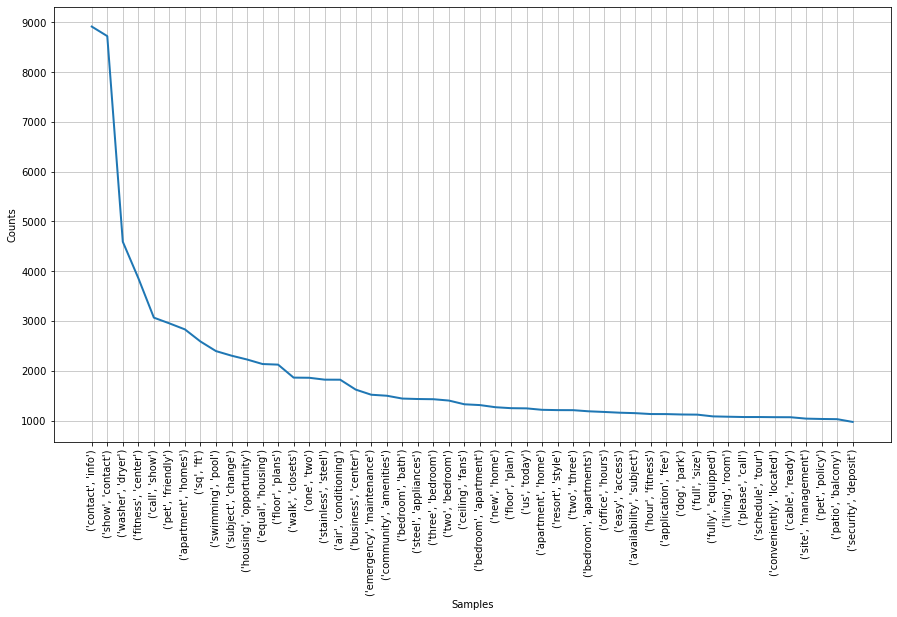

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [41]:
#plotting the bigram
plt.figure(figsize = (15,8))
fd_bigrams.plot(50)

### Performing the spatial analysis to get clear idea of where exactly houses are situated

In [ ]:
#!pip install folium
import folium
from folium.plugins import HeatMap

# creating a map
m = folium.Map(zoom_start = 3)
m

In [ ]:
HeatMap(data = df[['lat','long','price']],radius = 15).add_to(m)
m
#show the map
m

### Analysing Label distribution of data

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\anusha\anaconda3\li

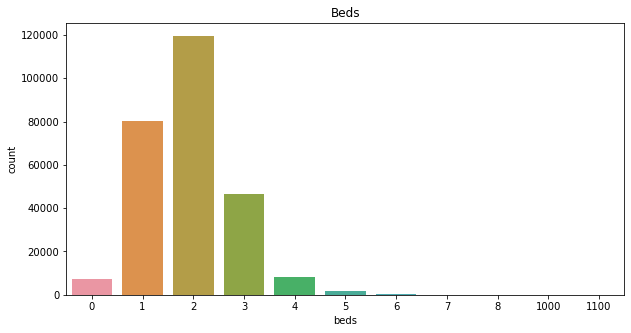

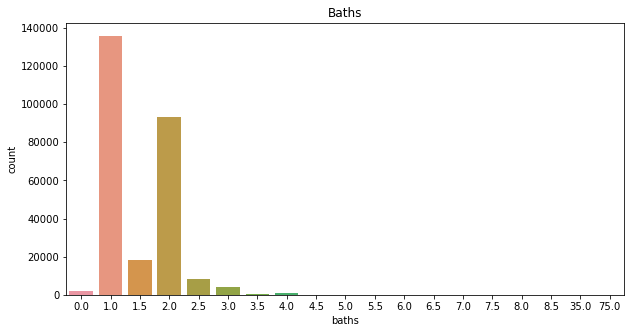

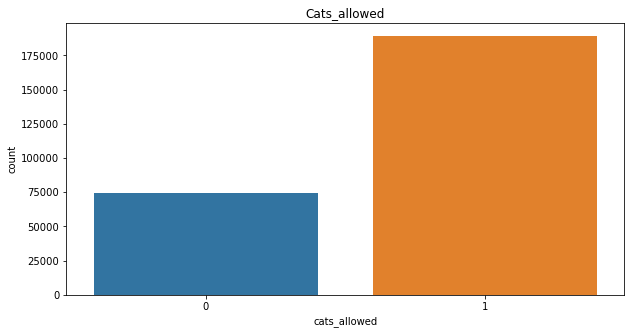

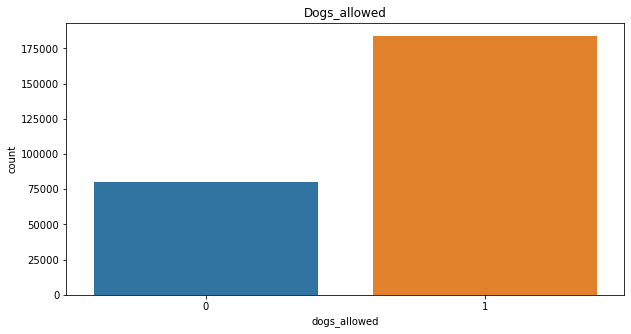

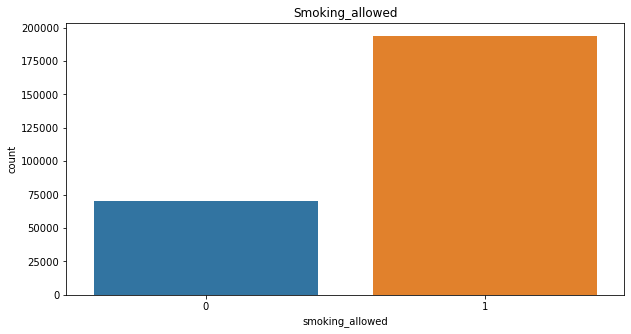

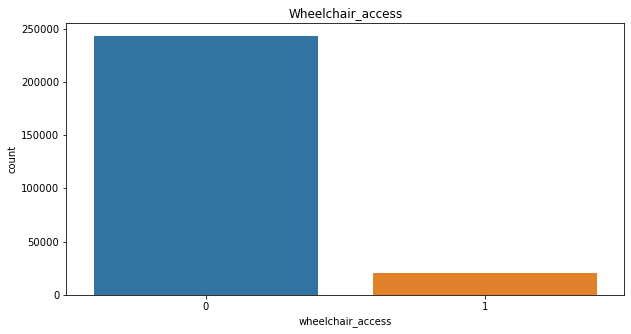

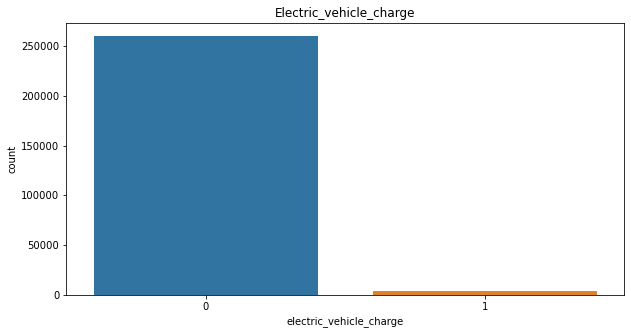

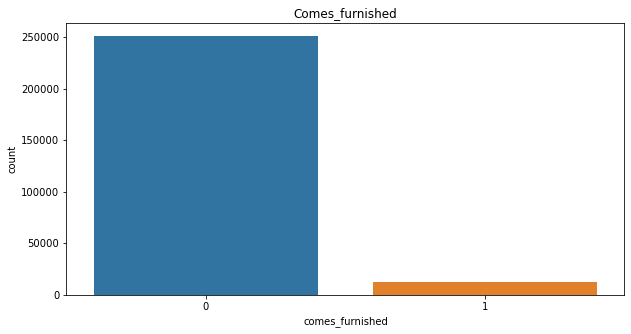

In [44]:
list=['beds','baths','cats_allowed','dogs_allowed','smoking_allowed','wheelchair_access','electric_vehicle_charge','comes_furnished']
for i in list:
    plt.figure(figsize=(10,5))
    sns.countplot(df[i]).set(title = i.capitalize())


### Detecting outliers with boxplot

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\anusha\anaconda3\li

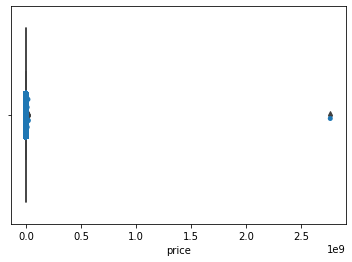

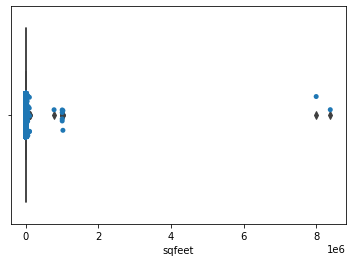

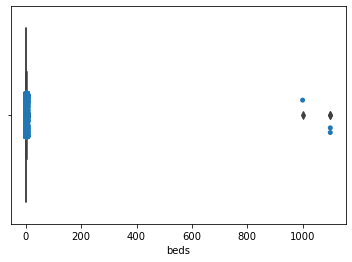

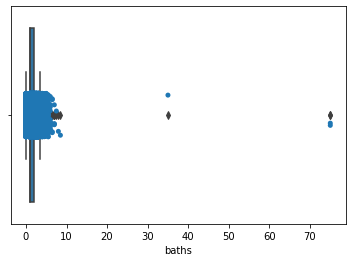

In [45]:
features=['price','sqfeet','beds','baths']

for i in features:
    plt.figure()
    sns.boxplot(df[i])
    sns.stripplot(df[i])

#### Detecting outliers using statistical approaches (Q-Qplot)

<Figure size 720x288 with 0 Axes>

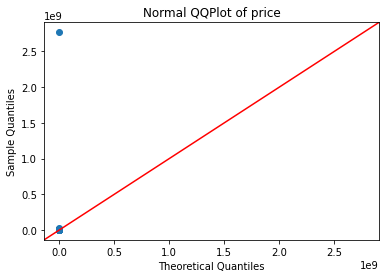

<Figure size 720x288 with 0 Axes>

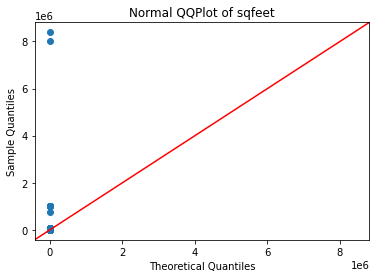

<Figure size 720x288 with 0 Axes>

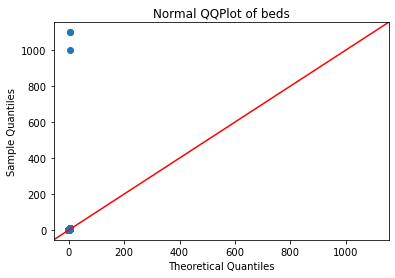

<Figure size 720x288 with 0 Axes>

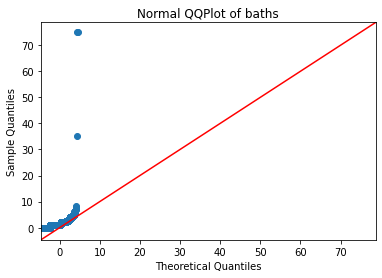

In [46]:
import statsmodels.api as sm

for i in features:
    plt.figure(figsize=(10,4))
    sm.qqplot(df[i],line='45')
    plt.title("Normal QQPlot of {}".format(i))

### Imputing Outliers using Statistical Techniques

In [47]:
data = df.copy()

#### PRICE

In [48]:
print("The median of price is {}".format(data['price'].median()))
print("The mean of price is {}".format(data['price'].mean()))
print(data['price'].nlargest(100))

The median of price is 1060.0
The mean of price is 12330.078647766433
110953    2768307249
23893       21701907
247250      18502000
247251      18502000
73730       12000000
             ...    
194276         38900
237380         38000
194438         32995
190308         32900
190310         31900
Name: price, Length: 100, dtype: int64


In [49]:
# replacing the price> 9000 with median
data['price']= np.where(data['price']>9000,data['price'].median(),data['price'])

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

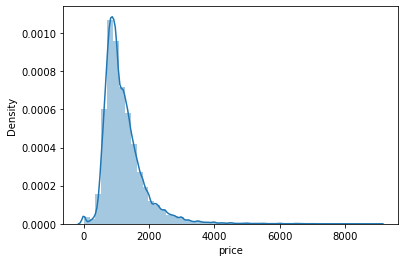

In [50]:
sns.distplot(data['price'])

#### SQFEET

In [51]:
print("The median of SQFEET is {}".format(data['sqfeet'].median()))
print("The mean of SQFEET is {}".format(data['sqfeet'].mean()))
print(data['sqfeet'].nlargest(100))

The median of SQFEET is 950.0
The mean of SQFEET is 1092.895420648972
195751    8388607
7862      8000000
42751     1019856
42752     1019856
63022      999999
           ...   
54669        7000
63251        7000
121787       7000
189519       7000
189601       7000
Name: sqfeet, Length: 100, dtype: int64


C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='sqfeet', ylabel='Density'>

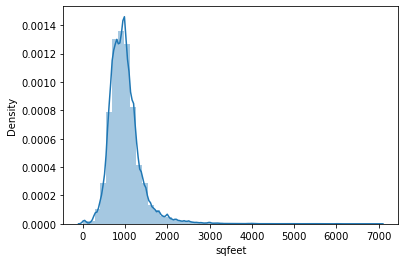

In [52]:
# replacing the sqfeet> 7000 with median
data['sqfeet']= np.where(data['sqfeet']>7000,data['sqfeet'].median(),data['sqfeet'])


sns.distplot(data['sqfeet'])

#### BEDS

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='beds', ylabel='Density'>

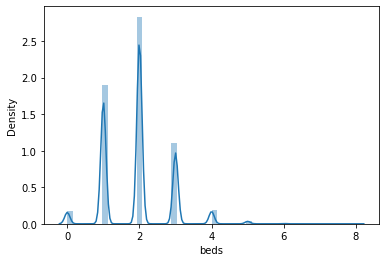

In [53]:
# replacing the beds> 800 with median
data['beds']= np.where(data['beds']>800,data['beds'].median(),data['beds'])


sns.distplot(data['beds'])

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='baths', ylabel='Density'>

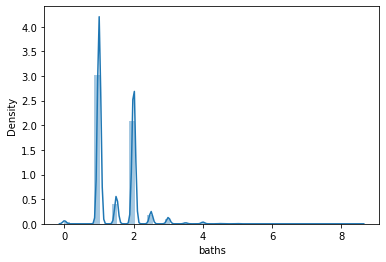

In [54]:
# replacing the baths> 10 with median
data['baths']= np.where(data['baths']>10,data['baths'].median(),data['baths'])


sns.distplot(data['baths'])

#### Analysing Distribution of price where dogs are allowed & dogs are not allowed

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Price Distribution')

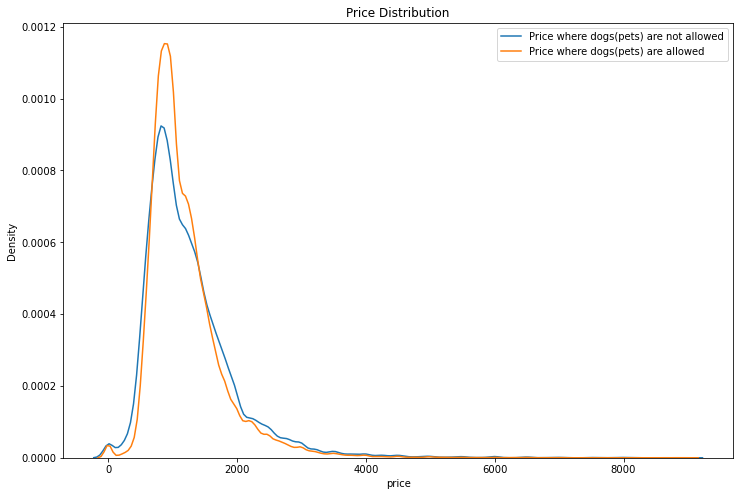

In [55]:
plt.figure(figsize=(12,8))
sns.distplot(data[data['dogs_allowed']==0]['price'],hist=False,label="Price where dogs(pets) are not allowed")
sns.distplot(data[data['dogs_allowed']==1]['price'],hist=False,label="Price where dogs(pets) are allowed")
plt.legend()
plt.title("Price Distribution")

#### Analysing Distribution of price where cats are allowed & cats are not allowed

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Price Distribution')

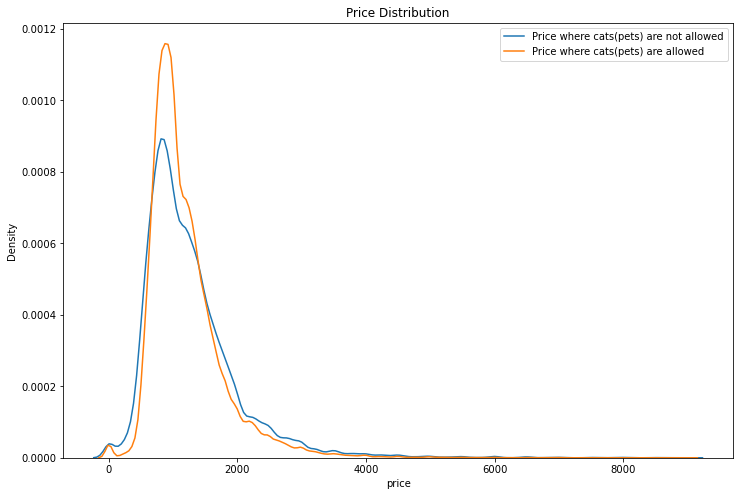

In [56]:
plt.figure(figsize=(12,8))
sns.distplot(data[data['cats_allowed']==0]['price'],hist=False,label="Price where cats(pets) are not allowed")
sns.distplot(data[data['cats_allowed']==1]['price'],hist=False,label="Price where cats(pets) are allowed")
plt.legend()
plt.title("Price Distribution")

### Observation :
***The price is not varying significantly with dogs/cats allowed or not.***

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Price Distribution')

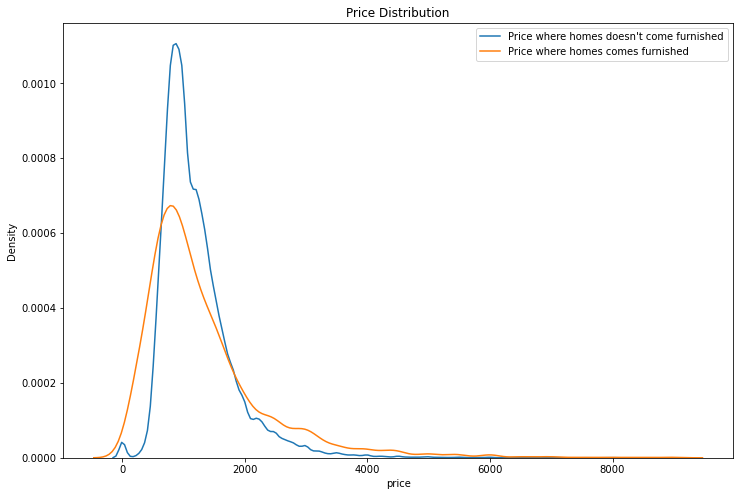

In [57]:
plt.figure(figsize=(12,8))
sns.distplot(data[data['comes_furnished']==0]['price'],hist=False,label="Price where homes doesn't come furnished")
sns.distplot(data[data['comes_furnished']==1]['price'],hist=False,label="Price where homes comes furnished")
plt.legend()
plt.title("Price Distribution")

### Observation :
***The price is not varying significantly with furnished/not furnished homes.***

C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\anusha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Price Distribution')

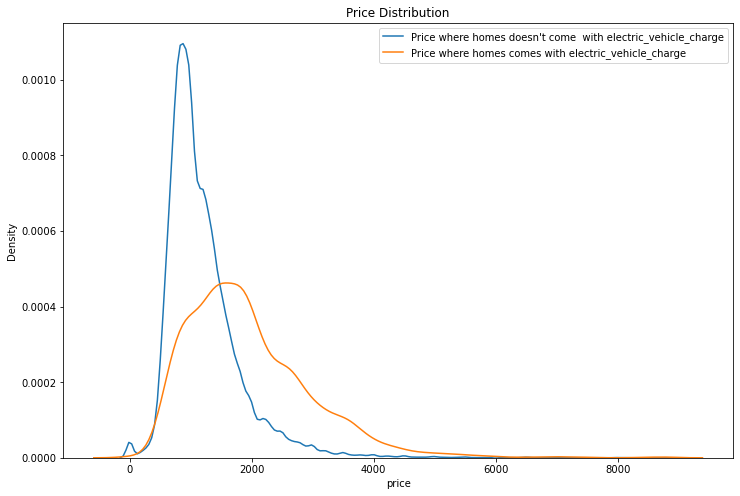

In [58]:
plt.figure(figsize=(12,8))
sns.distplot(data[data['electric_vehicle_charge']==0]['price'],hist=False,label="Price where homes doesn't come  with electric_vehicle_charge")
sns.distplot(data[data['electric_vehicle_charge']==1]['price'],hist=False,label="Price where homes comes with electric_vehicle_charge")
plt.legend()
plt.title("Price Distribution")

### Observation :
***The price is varying significantly with whether the homes are equipped with electric vehicle charger.***

In [59]:
data.corr().style.background_gradient(cmap='Reds')

,id,price,sqfeet,beds,baths,cats_allowed,dogs_allowed,smoking_allowed,wheelchair_access,electric_vehicle_charge,comes_furnished,lat,long
id,1.000000,0.131784,-0.037020,-0.064331,-0.029581,0.034818,0.024426,0.011674,0.012306,0.019057,-0.022436,-0.006378,-0.102851
price,0.131784,1.000000,0.347210,0.190628,0.266790,-0.047444,-0.038100,-0.161992,0.086301,0.137482,0.040219,-0.038629,-0.219865
sqfeet,-0.037020,0.347210,1.000000,0.729603,0.639450,-0.081168,-0.039768,-0.049696,-0.000759,0.007458,0.021627,-0.000202,0.035094
beds,-0.064331,0.190628,0.729603,1.000000,0.641341,-0.071272,-0.035495,-0.014372,-0.027641,-0.018272,0.017712,0.017202,0.020761
baths,-0.029581,0.266790,0.639450,0.641341,1.000000,-0.021490,0.018232,-0.020555,0.030413,0.009954,0.043990,-0.104677,-0.008859
cats_allowed,0.034818,-0.047444,-0.081168,-0.071272,-0.021490,1.000000,0.887186,0.036541,0.118325,0.053525,-0.076369,-0.013148,0.054597
dogs_allowed,0.024426,-0.038100,-0.039768,-0.035495,0.018232,0.887186,1.000000,0.031869,0.128308,0.053380,-0.055738,-0.052023,0.039935
smoking_allowed,0.011674,-0.161992,-0.049696,-0.014372,-0.020555,0.036541,0.031869,1.000000,-0.204326,-0.100159,-0.150293,-0.129610,0.118966
wheelchair_access,0.012306,0.086301,-0.000759,-0.027641,0.030413,0.118325,0.128308,-0.204326,1.000000,0.206526,0.152672,-0.019009,-0.006892
electric_vehicle_charge,0.019057,0.137482,0.007458,-0.018272,0.009954,0.053525,0.053380,-0.100159,0.206526,1.000000,0.069265,0.010245,-0.061936


### Higher Co-relation group

- sqfeet-- beds
- sqfeet-- baths
- dogs_allowed-- cats_allowed 

***it means we can drop beds, baths, cats_allowed***

### Relationship between AREA and PRICE

In [60]:
import plotly.express as px
fig=px.scatter(data, x="price", y="sqfeet")
fig.show()

#### There is a complex relationship between Price & sqfeet, meaning Linear Regression algorithm won't perform good

In [61]:
dataframe = data.copy()

dataframe.columns

Index(['id', 'region', 'price', 'type', 'sqfeet', 'beds', 'baths',
       'cats_allowed', 'dogs_allowed', 'smoking_allowed', 'wheelchair_access',
       'electric_vehicle_charge', 'comes_furnished', 'laundry_options',
       'parking_options', 'description', 'lat', 'long', 'state'],
      dtype='object')

In [62]:
dataframe.drop(['id','beds','baths','cats_allowed','description','lat','long'],axis = 1,inplace = True)

In [63]:
dataframe.dtypes

region                      object
price                      float64
type                        object
sqfeet                     float64
dogs_allowed                 int64
smoking_allowed              int64
wheelchair_access            int64
electric_vehicle_charge      int64
comes_furnished              int64
laundry_options             object
parking_options             object
state                       object
dtype: object

### Encountering categorical features

In [64]:
categorical = ['region','type','laundry_options','parking_options','state']

### obtaining the count of sub-categories
for feature in categorical:
    print('total sub categories in {} are {}'.format(feature,len(dataframe[feature].unique())))

total sub categories in region are 298
total sub categories in type are 12
total sub categories in laundry_options are 5
total sub categories in parking_options are 7
total sub categories in state are 38


In [65]:
region_count=dataframe['region'].value_counts()
region_count

jacksonville              4242
rochester                 3673
fayetteville              3636
omaha / council bluffs    2719
boulder                   2606
                          ... 
corvallis/albany             3
kansas city                  3
northwest OK                 2
east oregon                  1
texoma                       1
Name: region, Length: 298, dtype: int64

In [66]:
len(region_count[region_count>500])

141

In [67]:
important=region_count[region_count>500].index
important


Index(['jacksonville', 'rochester', 'fayetteville', 'omaha / council bluffs',
       'boulder', 'denver', 'ventura county', 'savannah / hinesville',
       'stockton', 'fort collins / north CO',
       ...
       'fargo / moorhead', 'columbia / jeff city', 'long island', 'ocala',
       'birmingham', 'southern maryland', 'billings', 'lawrence', 'monroe',
       'valdosta'],
      dtype='object', length=141)

In [68]:
def remove(x):
    if x not in important:
        return 'other'
    else:
        return x

In [69]:
dataframe['region']=dataframe['region'].apply(remove)

In [70]:
len(dataframe['region'].unique())

142

#### STATE FEATURE

In [71]:
count=dataframe['state'].value_counts()
count

ca    32997
fl    31687
nc    18490
mi    14439
ga    13773
co    11200
ny     9958
il     9615
ks     7889
ia     7462
mn     7445
md     7437
la     7291
az     6742
oh     6537
in     6400
al     6190
nj     5601
ky     5397
ms     4963
ma     4894
id     4365
ct     3753
nd     3428
ar     3145
nm     2907
nv     2836
ne     2693
dc     2478
ak     2148
mo     2137
de     2046
hi     1830
nh     1754
mt     1331
me      420
ok       49
or       44
Name: state, dtype: int64

In [72]:
important=count[count>2000].index

In [73]:
dataframe['state']=dataframe['state'].apply(remove)

In [74]:
dataframe['state'].nunique()

33

#### TYPE FEATURE

In [75]:
count=dataframe['type'].value_counts()
count

apartment          217090
house               23400
townhouse           10295
condo                4841
duplex               3436
manufactured         3004
cottage/cabin         697
loft                  510
flat                  349
in-law                144
land                    4
assisted living         1
Name: type, dtype: int64

In [76]:
important=count[count>3000].index
dataframe['type']=dataframe['type'].apply(remove)
dataframe['type'].nunique()

7

In [77]:
### obtaining the count of sub-categories
for feature in categorical:
    print('total sub categories in {} are {}'.format(feature,len(dataframe[feature].unique())))

total sub categories in region are 142
total sub categories in type are 7
total sub categories in laundry_options are 5
total sub categories in parking_options are 7
total sub categories in state are 33


In [78]:
data = dataframe.copy()

### Performing  Frequency encoding on state  and region feature as it has multiple sub-categories using CountEncoder class

In [79]:
from category_encoders import CountEncoder
ce=CountEncoder()

dataframe['state']=ce.fit_transform(dataframe['state'])

In [80]:
ce1 = CountEncoder()
dataframe['region']=ce1.fit_transform(dataframe['region'])

In [81]:
dataframe['state']

0         6190
1         6190
2         6190
3         6190
4         6190
          ... 
265184    6537
265185    6537
265186    6537
265187    6537
265188    6537
Name: state, Length: 263771, dtype: int64

### Performing Label encoding on 'laundry_options','parking_options','type'

In [82]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for feature in ['laundry_options','parking_options','type']:
    dataframe[feature]=le.fit_transform(dataframe[feature])

In [83]:
dataframe.dtypes

region                       int64
price                      float64
type                         int32
sqfeet                     float64
dogs_allowed                 int64
smoking_allowed              int64
wheelchair_access            int64
electric_vehicle_charge      int64
comes_furnished              int64
laundry_options              int32
parking_options              int32
state                        int64
dtype: object

In [84]:
dataframe.head()

,region,price,type,sqfeet,dogs_allowed,smoking_allowed,wheelchair_access,electric_vehicle_charge,comes_furnished,laundry_options,parking_options,state
0,558,1195.0,0,1908.0,1,1,0,0,0,1,5,6190
1,558,1120.0,0,1319.0,1,1,0,0,0,1,4,6190
2,558,825.0,0,1133.0,1,1,0,0,0,1,5,6190
3,558,800.0,0,927.0,1,1,0,0,0,1,5,6190
4,558,785.0,0,1047.0,1,1,0,0,0,1,5,6190


#### The data is cleaned and is ready for modelling

<h2>MODELLING</h2>

In [85]:
# obtaining the independent and dependent variable
y=dataframe['price']
x=dataframe.drop('price',axis=1)

In [86]:
#split dataset into train and test data
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,train_size=0.8,random_state=0)

In [87]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor(random_state=0)
dt.fit(x_train,y_train)

DecisionTreeRegressor(random_state=0)

In [88]:
y_pred=dt.predict(x_test)
y_pred

array([ 800. , 2150. , 2867.5, ...,  518. , 2064. , 1099. ])

### Evaluating performance

In [89]:
from sklearn.metrics import r2_score
r2=r2_score(y_test,y_pred)
r2

0.6369573752744593

In [90]:
#fit Regression models
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor


### classifier models
models = []
models.append(('LinearRegression', LinearRegression()))
models.append(('RandomForest', RandomForestRegressor()))
models.append(('Decision Tree', DecisionTreeRegressor()))
models.append(('KNN', KNeighborsRegressor(n_neighbors = 5)))

In [91]:

for name, model in models:
    print(name)
    model.fit(x_train, y_train)
    
    # Make predictions.
    predictions = model.predict(x_test)

    # Compute the error.
    from sklearn.metrics import r2_score
    print(r2_score(predictions, y_test))

    print('\n')

LinearRegression
-1.8723470523082515


RandomForest
0.7398024100272547


Decision Tree
0.6355353092447944


KNN
0.6645825998003583




### RandonForest performs BEST

### Hyperparameter optimization using RandomizedSearchCV

In [92]:
dataframe.shape

(263771, 12)

In [93]:
final_sample=dataframe[0:10000]

In [94]:
dep=final_sample['price']
ind=final_sample.drop('price',axis=1)

In [95]:
#split dataset into train and test
from sklearn.model_selection import train_test_split
sample_x_train,sample_x_test,sample_y_train,sample_y_test=train_test_split(ind,dep,train_size=0.8,random_state=0)

In [96]:
from sklearn.model_selection import RandomizedSearchCV

In [97]:
#Randomized Search CV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 4)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 3)]
# Minimum number of samples required to split a node
min_samples_split = [ 5, 15, 100]


In [98]:
# Creating the random grid

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split}

In [99]:
from sklearn.ensemble import RandomForestRegressor
reg_rf=RandomForestRegressor()

In [100]:
# Random search of parameters, using 5 fold cross validation, 
rf_random = RandomizedSearchCV(estimator = reg_rf, param_distributions = random_grid, cv = 3, verbose=2, n_jobs = -1)

In [101]:
rf_random.fit(sample_x_train,sample_y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 17, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_split': [5, 15, 100],
                                        'n_estimators': [100, 466, 833, 1200]},
                   verbose=2)

In [102]:
rf_random.best_params_

{'n_estimators': 833,
 'min_samples_split': 5,
 'max_features': 'sqrt',
 'max_depth': 17}

In [103]:
prediction = rf_random.predict(sample_x_test)

In [104]:
r2_score(sample_y_test,prediction)

0.7629514608107044